# plant segmentation


### Importing Libraries

In [1]:
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

import cv2
from tqdm import tqdm_notebook, tnrange
from glob import glob
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split
from IPython.display import Image, display

import tensorflow as tf
from skimage.color import rgb2gray
from tensorflow.keras import Input
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint


### Importing Dataset

In [2]:
import glob

# Image dimensions
im_width = 256
im_height = 256

# Path to your dataset
base_path = "/kaggle/input/plant-segment/plantseg"
mask_files = glob.glob(f"{base_path}/annotations/train/*.png")

# Collect image and mask filenames
image_filename_train = []

print(f"Found {len(mask_files)} mask files.")  # Check how many mask files were found

for mask_path in mask_files:
    # Replace "annotation" in the path with "images" to get the corresponding image path
    image_path = mask_path.replace("/annotation/", "/images/")
    
    image_filename_train.append(image_path)

# Display the first 10 image paths and the total count
print(image_filename_train[:10])
print(f"Total synchronized files: {len(image_filename_train)}")


Found 9163 mask files.
['/kaggle/input/plant-segment/plantseg/annotations/train/wheat_head_scab_Baidu_0344.png', '/kaggle/input/plant-segment/plantseg/annotations/train/wheat_head_scab_Baidu_0057.png', '/kaggle/input/plant-segment/plantseg/annotations/train/wheat_bacterial_leaf_streak_(black_chaff)_Baidu_0002.png', '/kaggle/input/plant-segment/plantseg/annotations/train/potato_late_blight_google_0049.png', '/kaggle/input/plant-segment/plantseg/annotations/train/rice_sheath_blight_google_0089.png', '/kaggle/input/plant-segment/plantseg/annotations/train/banana_bunchy_top_Bing_0223.png', '/kaggle/input/plant-segment/plantseg/annotations/train/tomato_late_blight_google_0043.png', '/kaggle/input/plant-segment/plantseg/annotations/train/corn_smut_49.png', '/kaggle/input/plant-segment/plantseg/annotations/train/ginger_sheath_blight_28.png', '/kaggle/input/plant-segment/plantseg/annotations/train/banana_black_leaf_streak_banana black sigatoka (63).png']
Total synchronized files: 9163


In [3]:
def plot_from_img_path(rows, columns, list_img_path, list_mask_path):
    fig = plt.figure(figsize  = (12,12))
    for i in range(1, rows * columns + 1):
        fig.add_subplot(rows, columns, i)
        img_path = list_img_path[i]
        mask_path = list_mask_path[i]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.4)
    plt.show()

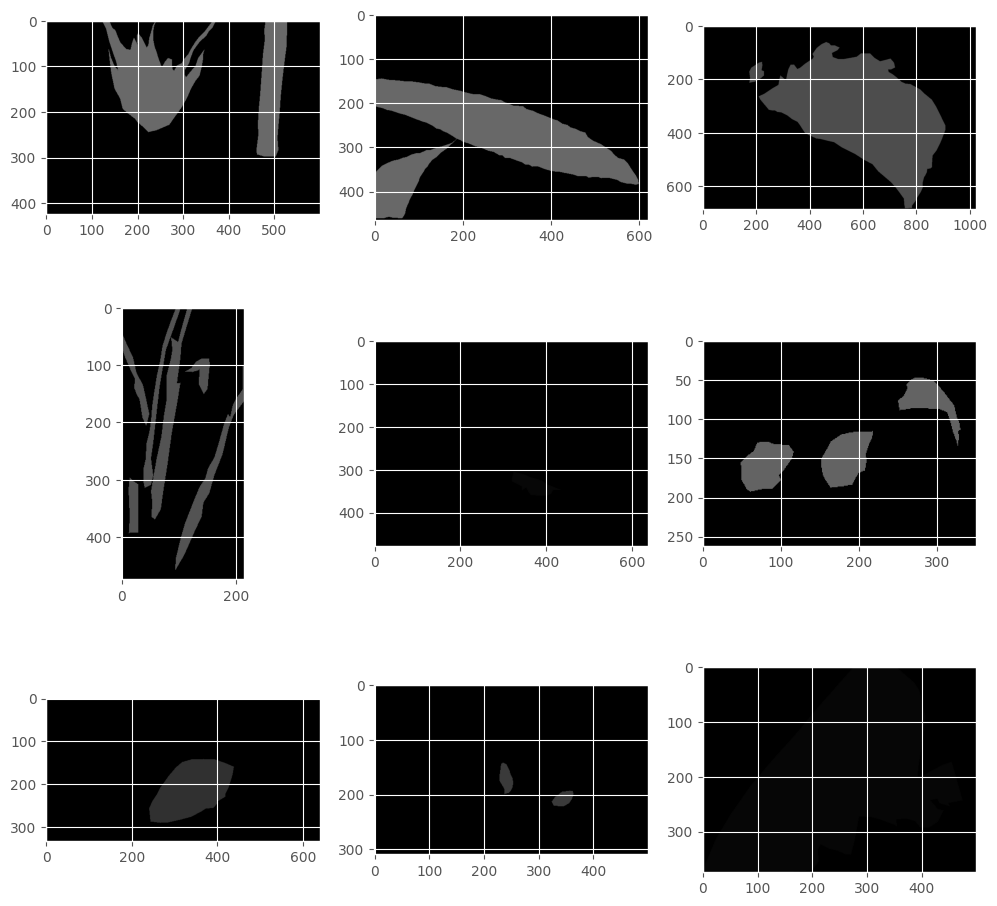

In [4]:
plot_from_img_path(3, 3, image_filename_train, mask_files)

### Preprocessing the Data

In [5]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

# Image dimensions
im_width = 256
im_height = 256

# Set paths
base_path = '/kaggle/input/plant-segment/plantseg'  # Replace with actual path
image_train_path = os.path.join(base_path, 'images', 'train')
image_test_path = os.path.join(base_path, 'images', 'test')
mask_train_path = os.path.join(base_path, 'annotations', 'train')
mask_test_path = os.path.join(base_path, 'annotations', 'test')

# Collect file paths
image_train_files = sorted([os.path.join(image_train_path, f) for f in os.listdir(image_train_path) if f.endswith(('.png', '.jpg', '.tif'))])
mask_train_files = sorted([os.path.join(mask_train_path, f) for f in os.listdir(mask_train_path) if f.endswith(('.png', '.jpg', '.tif'))])

image_test_files = sorted([os.path.join(image_test_path, f) for f in os.listdir(image_test_path) if f.endswith(('.png', '.jpg', '.tif'))])
mask_test_files = sorted([os.path.join(mask_test_path, f) for f in os.listdir(mask_test_path) if f.endswith(('.png', '.jpg', '.tif'))])

# Create dataframe for train
df_train_full = pd.DataFrame({'image_filename_train': image_train_files, 'mask': mask_train_files})

# Select the first 1500 images for initial training (or fewer if not enough images)
# df_train_initial = df_train_full.iloc[:300]

# Split the initial 1500 images into train and validation
df_train, df_val = train_test_split(df_train_full, test_size=0.05, random_state=42)

# Create dataframe for test (no split, direct association)
df_test = pd.DataFrame({'image_filename_test': image_test_files, 'mask': mask_test_files})

# Print information about the split
print(f"Train set size: {len(df_train)}")
print(f"Validation set size: {len(df_val)}")
print(f"Test set size: {len(df_test)}")



Train set size: 8704
Validation set size: 459
Test set size: 2295


In [6]:
print(df_train.shape)
print(df_val.shape)
print(df_test.shape)

(8704, 2)
(459, 2)
(2295, 2)


In [7]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def train_generator(
        data_frame,
        batch_size,
        augmentation_dict,
        image_color_mode="rgb",
        mask_color_mode="grayscale",
        image_save_prefix="image",
        mask_save_prefix="mask",
        save_to_dir=None,
        target_size=(256, 256),
        seed=1,
    ):


    image_datagen = ImageDataGenerator(**augmentation_dict)
    mask_datagen = ImageDataGenerator(**augmentation_dict)

    # Initialize image and mask generators
    image_col = 'image_filename_train' if 'image_filename_train' in data_frame.columns else 'image_filename_test'
    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col=image_col,  # Ensure correct column name
        class_mode=None,
        color_mode=image_color_mode,
        target_size=target_size,
        batch_size=batch_size,
        save_to_dir=save_to_dir,
        save_prefix=image_save_prefix,
        seed=seed,
    )

    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col="mask",  # Ensure correct column name
        class_mode=None,
        color_mode=mask_color_mode,
        target_size=target_size,
        batch_size=batch_size,
        save_to_dir=save_to_dir,
        save_prefix=mask_save_prefix,
        seed=seed,
    )

    # Combine image and mask generators using zip
    train_gen = zip(image_generator, mask_generator)

    for (img, mask) in train_gen:
        # Check for None values in the batch
        if img is None or mask is None:
            print("Error: None value found in the batch!")
            continue  # Skip this batch and proceed to the next

        # Check for None values after augmentation
        if img is None or mask is None:
            print("Error: Augmented image or mask is None!")
            continue

        # Normalize and diagnose (if applicable)
        img, mask = normalize_and_diagnose(img, mask) 

        yield (img, mask)

In [8]:
from keras.saving import register_keras_serializable



def normalize_and_diagnose(img, mask):
    img = img / 255
    mask = mask / 255
    return(img, mask)

@register_keras_serializable()
def dice_coefficients(y_true, y_pred, smooth=100):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)

    intersection = K.sum(y_true_flatten * y_pred_flatten)
    union = K.sum(y_true_flatten) + K.sum(y_pred_flatten)
    return (2 * intersection + smooth) / (union + smooth)

@register_keras_serializable()
def dice_coefficients_loss(y_true, y_pred, smooth=100):
    return -dice_coefficients(y_true, y_pred, smooth)

@register_keras_serializable()
def iou(y_true, y_pred, smooth=100):
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou
def jaccard_distance(y_true, y_pred):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)
    return -iou(y_true_flatten, y_pred_flatten)

@register_keras_serializable()
def pixel_accuracy(y_true, y_pred):
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)
    correct_predictions = K.sum(K.cast(K.equal(y_true_flatten, K.round(y_pred_flatten)), K.floatx()))
    total_pixels = K.cast(K.shape(y_true_flatten)[0], K.floatx())
    return correct_predictions / total_pixels


### UNet Architecture

In [9]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, BatchNormalization, Activation, concatenate, UpSampling2D, Add, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.layers import DepthwiseConv2D
import tensorflow as tf

# Define the weighted sum fusion function
def weighted_feature_fusion(features, filters, name):
    transformed_features = [Conv2D(filters, kernel_size=(1, 1), padding="same")(feature) for feature in features]
    w = tf.Variable(initial_value=tf.ones((len(features),), dtype=tf.float32), trainable=True, name=f"weights_{name}")
    w = tf.nn.relu(w)
    weight_sum = tf.reduce_sum(w) + 1e-4
    weights = w / weight_sum
    fused_feature = Add()([weights[i] * transformed_features[i] for i in range(len(features))])
    return fused_feature

# Define the Depthwise Separable Convolution used in BiFPN
def depthwise_separable_conv(x, filters, kernel_size, strides=1, padding="same"):
    x = DepthwiseConv2D(kernel_size=kernel_size, strides=strides, padding=padding)(x)
    x = Conv2D(filters, kernel_size=(1, 1), padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

# Define the BiFPN block
def BiFPNBlock(features, filters):
    P3, P4, P5, P6, P7 = features

    # Top-down pathway
    P6_td = weighted_feature_fusion([P6, UpSampling2D()(P7)], filters, name="P6_td")
    P6_td = depthwise_separable_conv(P6_td, filters, kernel_size=3)

    P5_td = weighted_feature_fusion([P5, UpSampling2D()(P6_td)], filters, name="P5_td")
    P5_td = depthwise_separable_conv(P5_td, filters, kernel_size=3)

    P4_td = weighted_feature_fusion([P4, UpSampling2D()(P5_td)], filters, name="P4_td")
    P4_td = depthwise_separable_conv(P4_td, filters, kernel_size=3)

    P3_td = weighted_feature_fusion([P3, UpSampling2D()(P4_td)], filters, name="P3_td")
    P3_td = depthwise_separable_conv(P3_td, filters, kernel_size=3)

    # Bottom-up pathway
    P4_out = weighted_feature_fusion([P4, P4_td, MaxPooling2D(pool_size=(2, 2))(P3_td)], filters, name="P4_out")
    P4_out = depthwise_separable_conv(P4_out, filters, kernel_size=3)

    P5_out = weighted_feature_fusion([P5, P5_td, MaxPooling2D(pool_size=(2, 2))(P4_out)], filters, name="P5_out")
    P5_out = depthwise_separable_conv(P5_out, filters, kernel_size=3)

    P6_out = weighted_feature_fusion([P6, P6_td, MaxPooling2D(pool_size=(2, 2))(P5_out)], filters, name="P6_out")
    P6_out = depthwise_separable_conv(P6_out, filters, kernel_size=3)

    P7_out = weighted_feature_fusion([P7, MaxPooling2D(pool_size=(2, 2))(P6_out)], filters, name="P7_out")
    P7_out = depthwise_separable_conv(P7_out, filters, kernel_size=3)

    return [P3_td, P4_out, P5_out, P6_out, P7_out]


# Define the U-Net with BiFPN decoder
def unet_with_bifpn(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Encoder
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Activation("relu")(conv1)
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(conv1)
    conv1 = BatchNormalization()(conv1)
    conv1 = Activation("relu")(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Activation("relu")(conv2)
    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(conv2)
    conv2 = BatchNormalization()(conv2)
    conv2 = Activation("relu")(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Activation("relu")(conv3)
    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(conv3)
    conv3 = BatchNormalization()(conv3)
    conv3 = Activation("relu")(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Activation("relu")(conv4)
    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(conv4)
    conv4 = BatchNormalization()(conv4)
    conv4 = Activation("relu")(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(pool4)
    conv5 = BatchNormalization()(conv5)
    conv5 = Activation("relu")(conv5)
    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(conv5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Activation("relu")(conv5)

    # Decoder with BiFPN
    P3 = conv1
    P4 = conv2
    P5 = conv3
    P6 = conv4
    P7 = conv5

    # BiFPN
    features = [P3, P4, P5, P6, P7]
    bifpn_features = BiFPNBlock(features, filters=256)

    # Final segmentation head
    final_feature = bifpn_features[0]  # Use the top-most feature map for segmentation
    output = Conv2D(filters=1, kernel_size=(1, 1), activation="sigmoid")(final_feature)

    return Model(inputs=[inputs], outputs=[output])

# Create the model
model = unet_with_bifpn()
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 256, 256, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 256, 256, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ activation_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 128, 128, 128)  │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 128, 128, 128)  │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 128)  │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 128, 128, 128)  │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ activation_3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 19,843,393 (75.70 MB)

 Trainable params: 19,833,409 (75.66 MB)

 Non-trainable params: 9,984 (39.00 KB)

### Training the UNet model

In [10]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint

EPOCHS = 40
BATCH_SIZE = 16
learning_rate = 1e-4

# Define data augmentation arguments
train_generator_args = dict(
    rotation_range=0,
    width_shift_range=0,
    height_shift_range=0,
    shear_range=0,
    zoom_range=0,
    horizontal_flip=False,
    fill_mode='nearest'
)

# Create data generators
train_gen = train_generator(df_train, BATCH_SIZE, train_generator_args, target_size=(im_height, im_width))
test_gener = train_generator(df_val, BATCH_SIZE, {}, target_size=(im_height, im_width)) 

# Define and compile the model
model = unet_with_bifpn(input_size=(im_height, im_width, 3)) 
opt = Adam(learning_rate=learning_rate)
model.compile(optimizer=opt, 
              loss=dice_coefficients_loss, 
              metrics=["binary_accuracy", iou, dice_coefficients, pixel_accuracy])

# Define model checkpoint
callbacks = [ModelCheckpoint('plant_segment_mod.keras', verbose=1, save_best_only=True)]

# Fit the model
history = model.fit(
    train_gen,
    steps_per_epoch=len(df_train) // BATCH_SIZE, 
    epochs=EPOCHS,
    callbacks=callbacks,
    validation_data=test_gener,
    validation_steps=len(df_val) // BATCH_SIZE
)


Found 8704 validated image filenames.
Found 8704 validated image filenames.
Epoch 1/40
544/544 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step - binary_accuracy: 0.6378 - dice_coefficients: 0.1859 - iou: 0.1038 - loss: -0.1859 - pixel_accuracy: 0.6378Found 459 validated image filenames.
Found 459 validated image filenames.

Epoch 1: val_loss improved from inf to -0.18998, saving model to plant_segment_mod.keras
544/544 ━━━━━━━━━━━━━━━━━━━━ 318s 502ms/step - binary_accuracy: 0.6379 - dice_coefficients: 0.1859 - iou: 0.1038 - loss: -0.1859 - pixel_accuracy: 0.6379 - val_binary_accuracy: 0.7598 - val_dice_coefficients: 0.1900 - val_iou: 0.1068 - val_loss: -0.1900 - val_pixel_accuracy: 0.7598
Epoch 2/40
544/544 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step - binary_accuracy: 0.7209 - dice_coefficients: 0.2301 - iou: 0.1313 - loss: -0.2301 - pixel_accuracy: 0.7209
Epoch 2: val_loss improved from -0.18998 to -0.22220, saving model to plant_segment_mod.keras
544/544 ━━━━━━━━━━━━━━━━━━━━ 273s 502ms/step - binary_accu

### Plotting the metrics

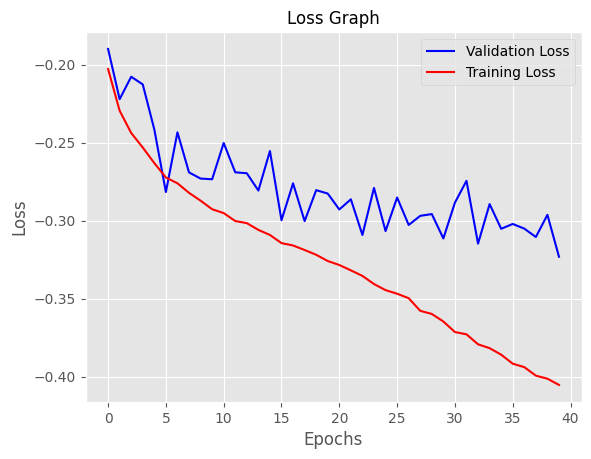

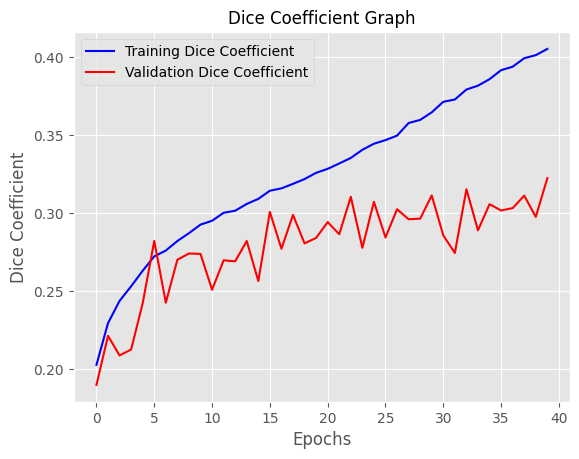

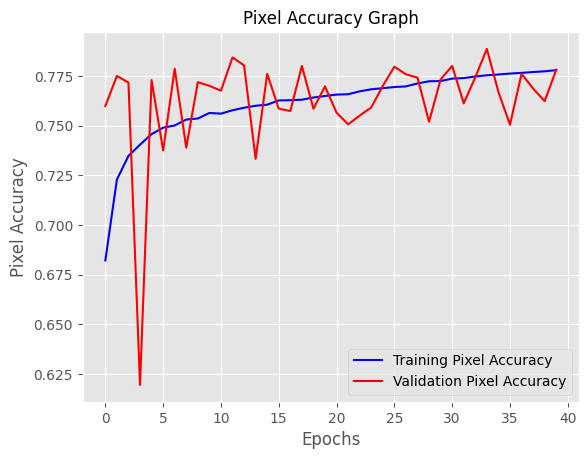

In [11]:
# Extract training history
history_post_training = history.history

# Dice Coefficients
train_dice_coeff_list = history_post_training['dice_coefficients']
test_dice_coeff_list = history_post_training['val_dice_coefficients']

# IoU (Jaccard Index)
train_jaccard_list = history_post_training['iou']
test_jaccard_list = history_post_training['val_iou']

# Loss
train_loss_list = history_post_training['loss']
test_loss_list = history_post_training['val_loss']

# Pixel Accuracy
train_pixel_accuracy_list = history_post_training['pixel_accuracy']
test_pixel_accuracy_list = history_post_training['val_pixel_accuracy']

# Plot Loss Graph
plt.figure(1)
plt.plot(test_loss_list, 'b-', label='Validation Loss')
plt.plot(train_loss_list, 'r-', label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Graph', fontsize=12)
plt.legend()

# Plot Dice Coefficient Graph
plt.figure(2)
plt.plot(train_dice_coeff_list, 'b-', label='Training Dice Coefficient')
plt.plot(test_dice_coeff_list, 'r-', label='Validation Dice Coefficient')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.title('Dice Coefficient Graph', fontsize=12)
plt.legend()

# Plot Pixel Accuracy Graph
plt.figure(3)
plt.plot(train_pixel_accuracy_list, 'b-', label='Training Pixel Accuracy')
plt.plot(test_pixel_accuracy_list, 'r-', label='Validation Pixel Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Pixel Accuracy')
plt.title('Pixel Accuracy Graph', fontsize=12)
plt.legend()

plt.show()


### Evaluating the Model

In [12]:
model = load_model('plant_segment_mod.keras', custom_objects={'dice_coef_loss': dice_coefficients_loss, 'iou': iou, 'dice_coef': dice_coefficients, 'pixel_accuracy': pixel_accuracy})

In [13]:
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height,im_width))

results = model.evaluate(test_gen, steps = len(df_test)//BATCH_SIZE)
print('Test Loss', results[0])
print('Test IOU', results[1])
print('Test Dice Coeff', results[2])
print('pixel_accuracy', results[3])

Found 2295 validated image filenames.
Found 2295 validated image filenames.
143/143 ━━━━━━━━━━━━━━━━━━━━ 52s 347ms/step - binary_accuracy: 0.7829 - dice_coefficients: 0.3015 - iou: 0.1798 - loss: -0.3015 - pixel_accuracy: 0.7829
Test Loss -0.301995187997818
Test IOU 0.7766265273094177
Test Dice Coeff 0.17992228269577026
pixel_accuracy 0.301995187997818


### Dsiplay Result

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


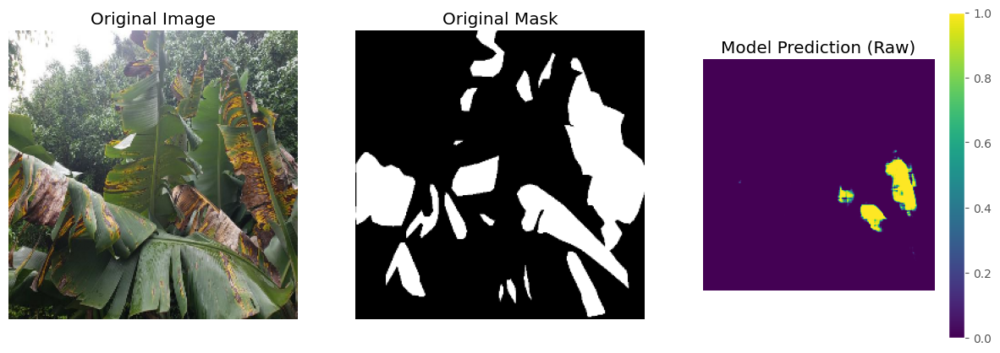

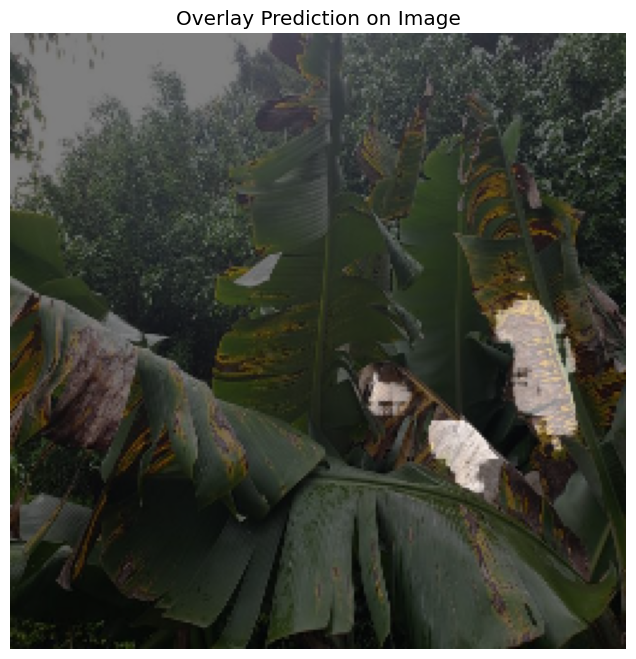

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


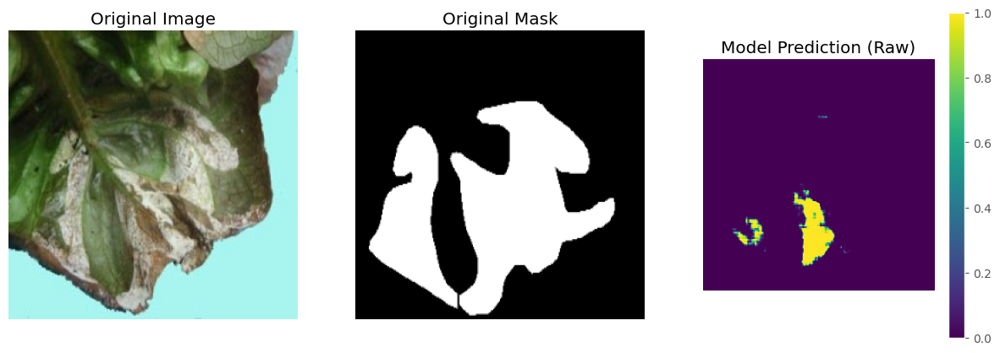

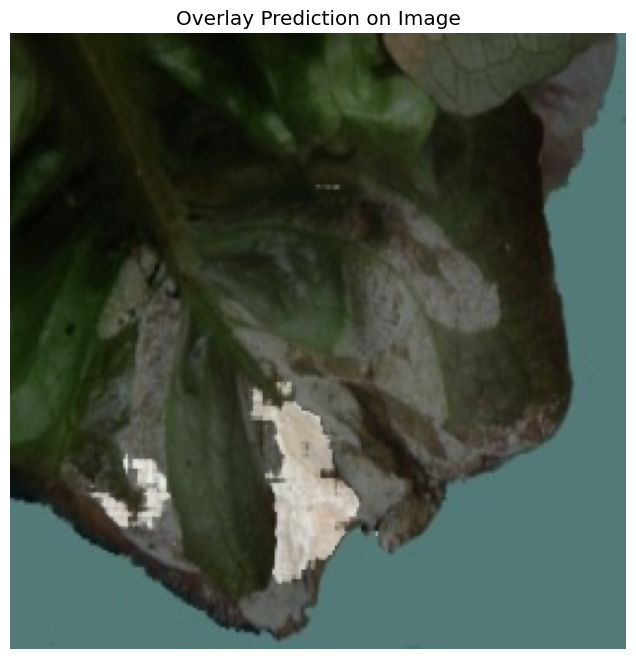

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


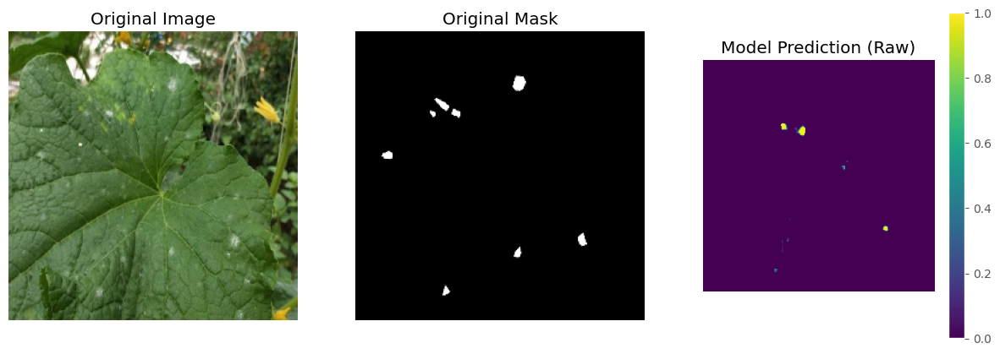

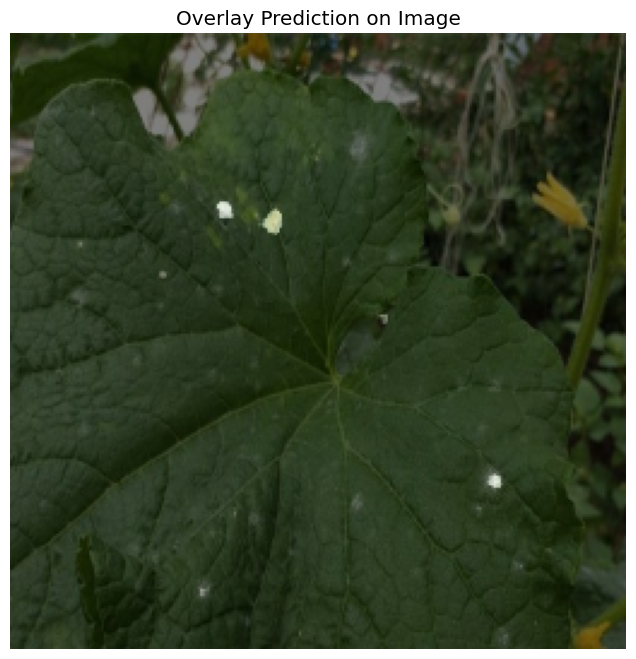

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


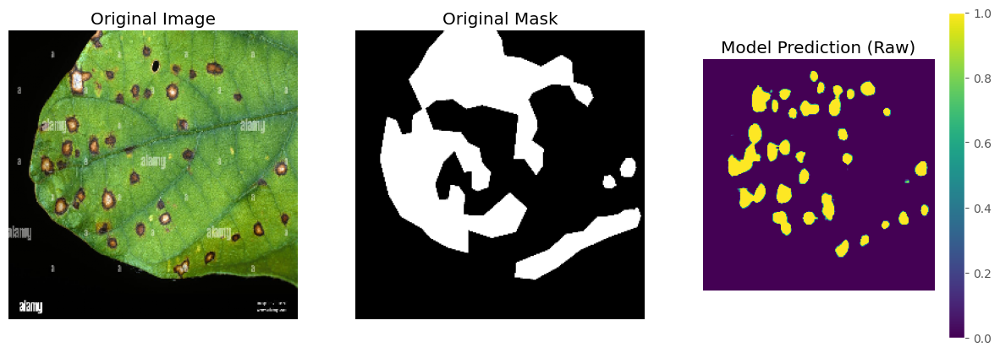

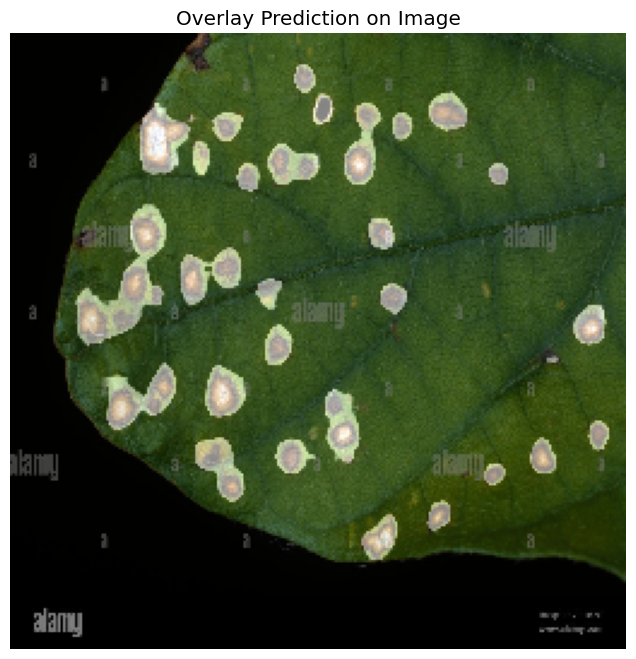

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


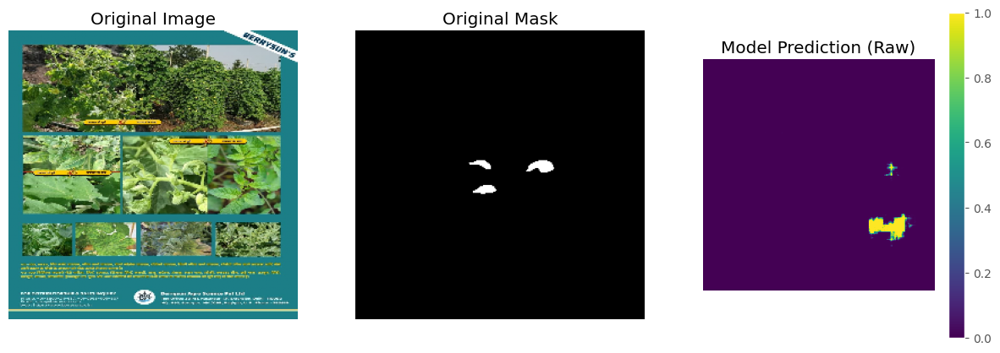

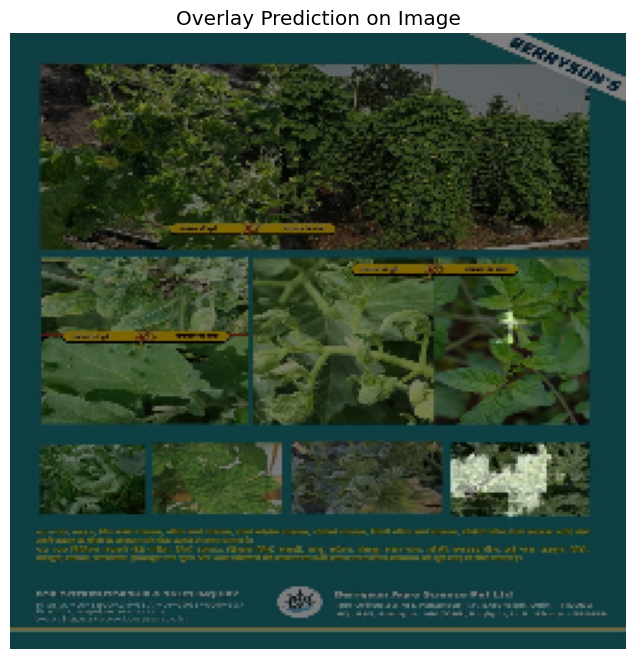

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


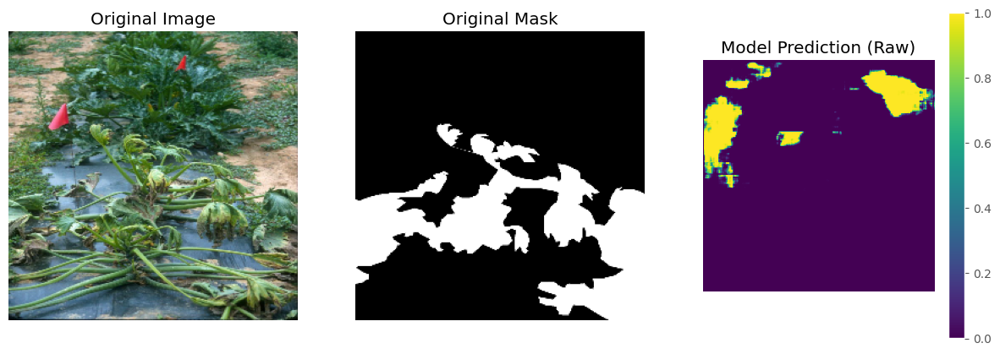

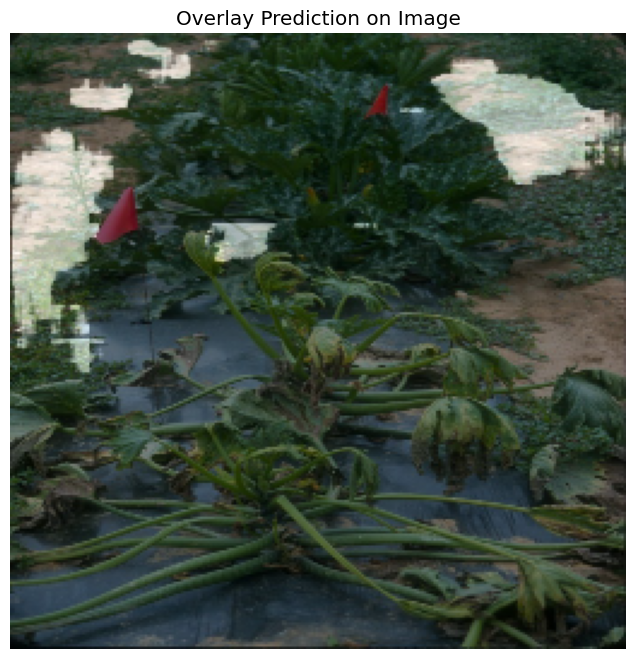

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


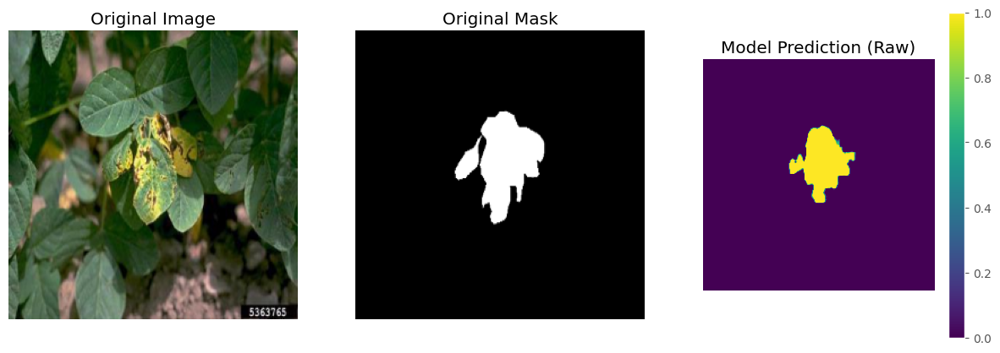

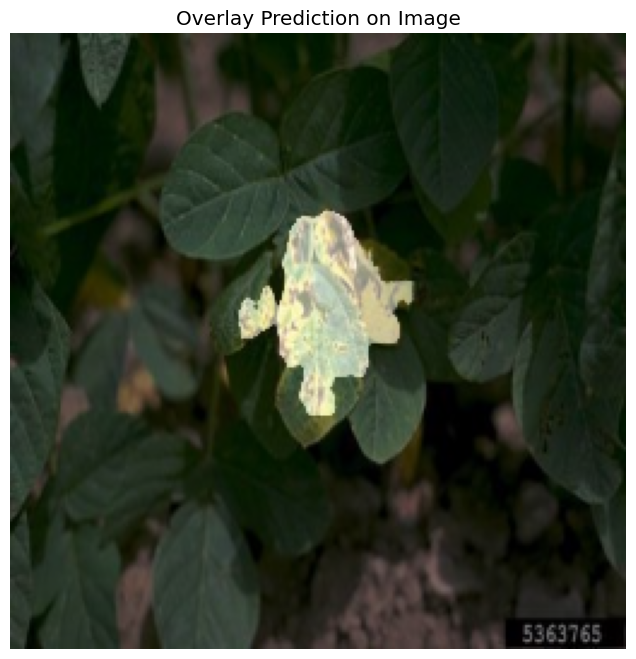

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


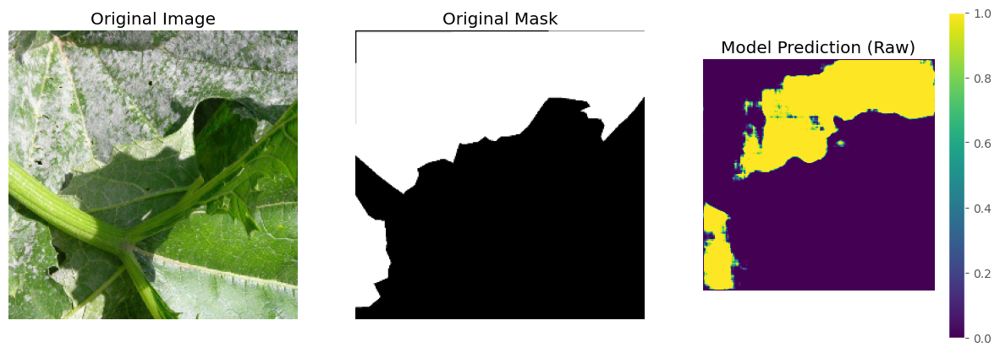

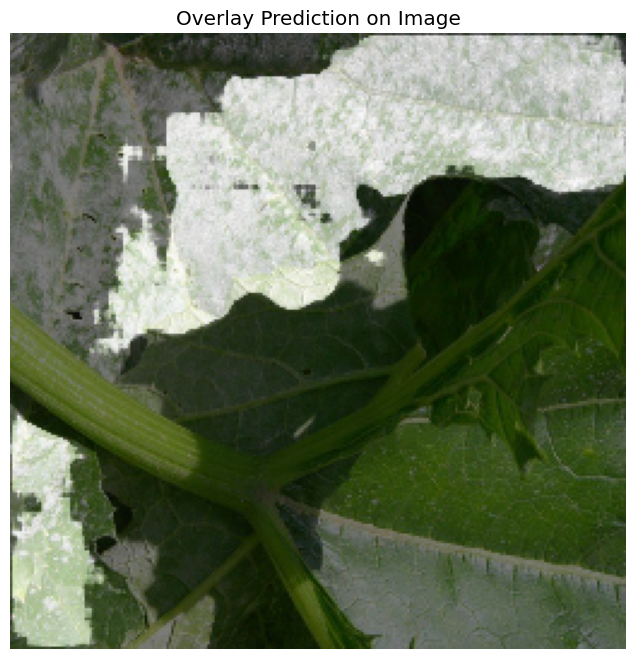

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


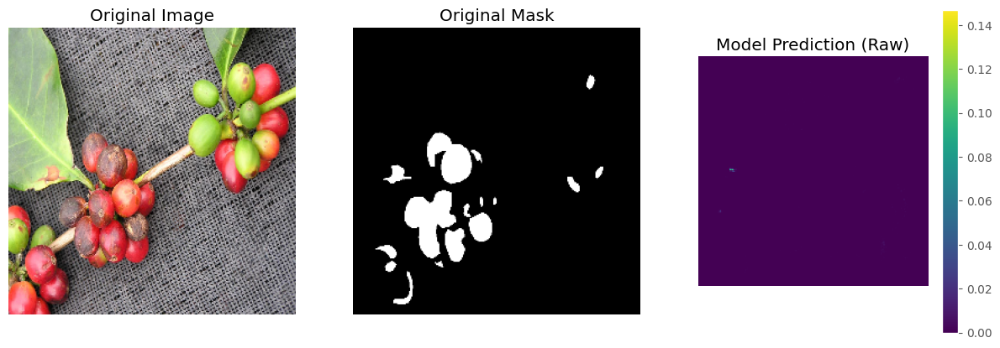

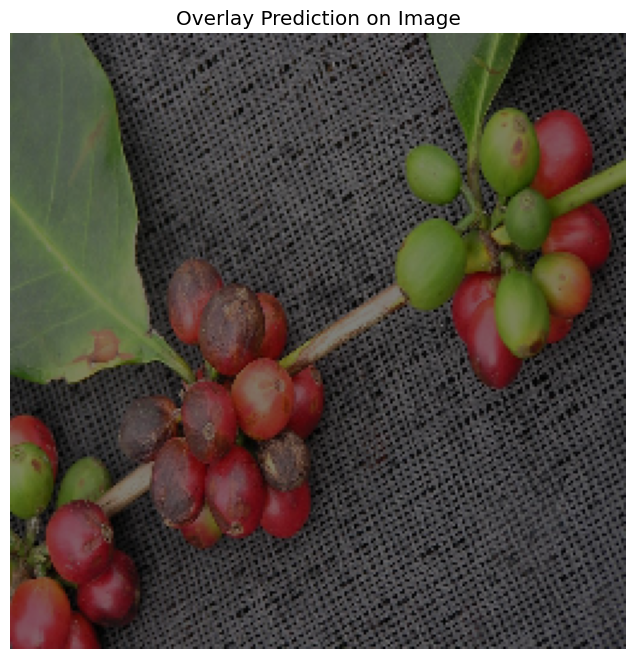

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


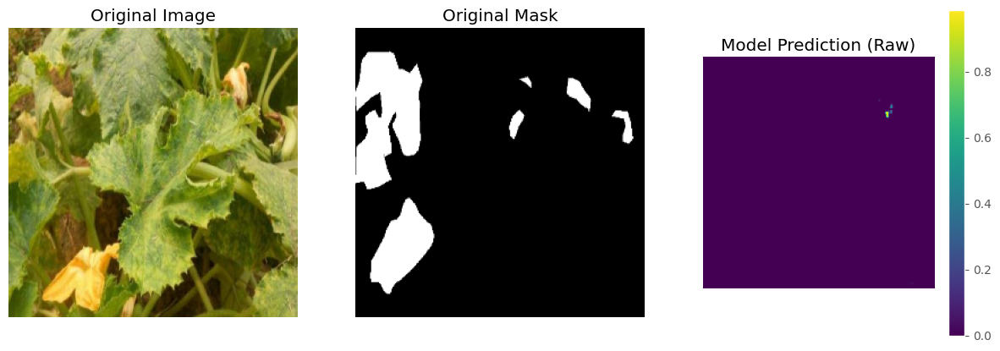

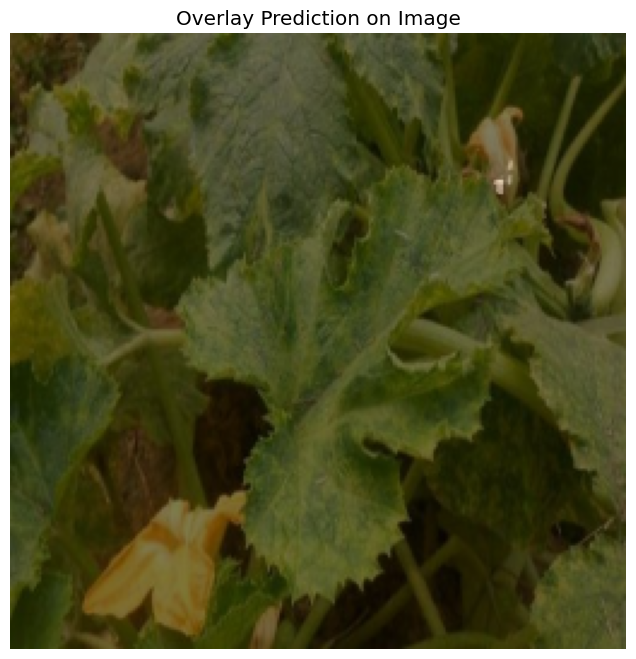

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


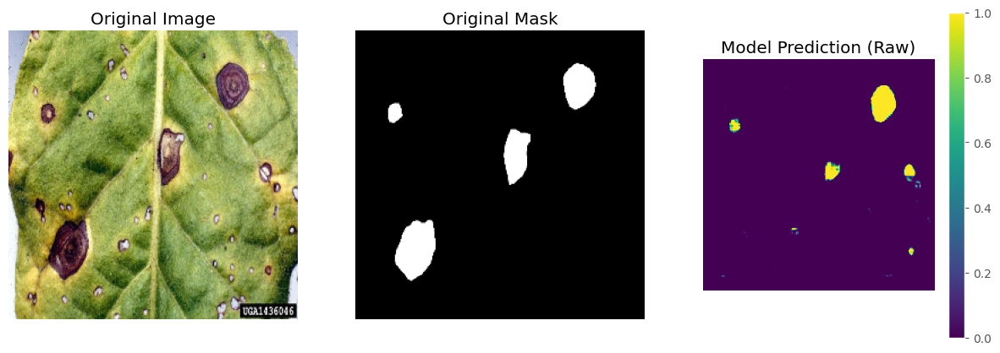

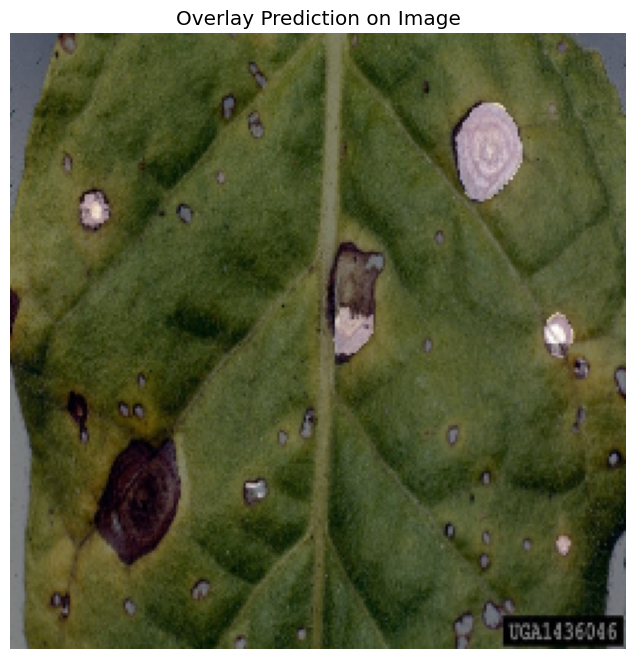

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


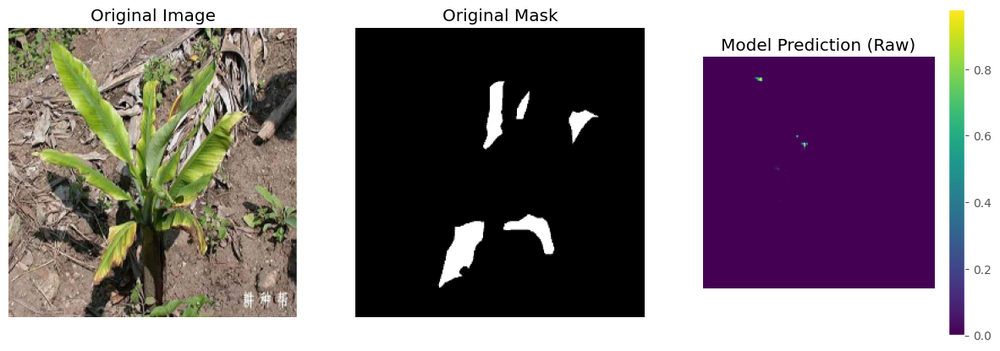

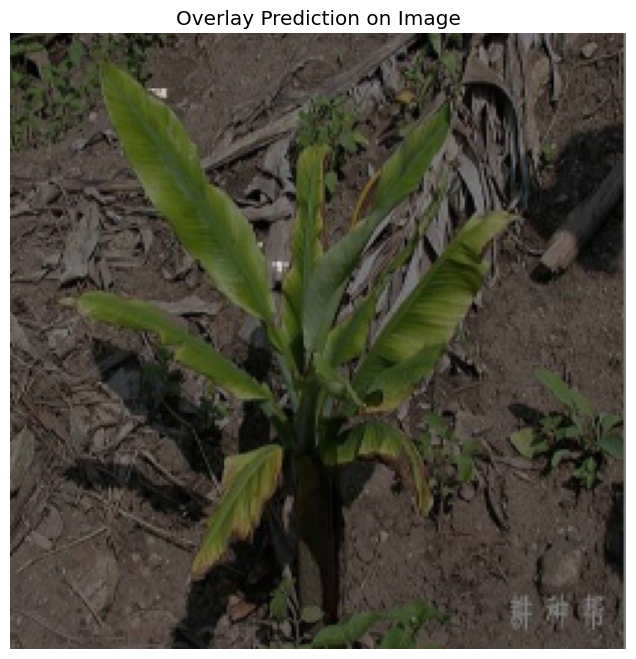

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


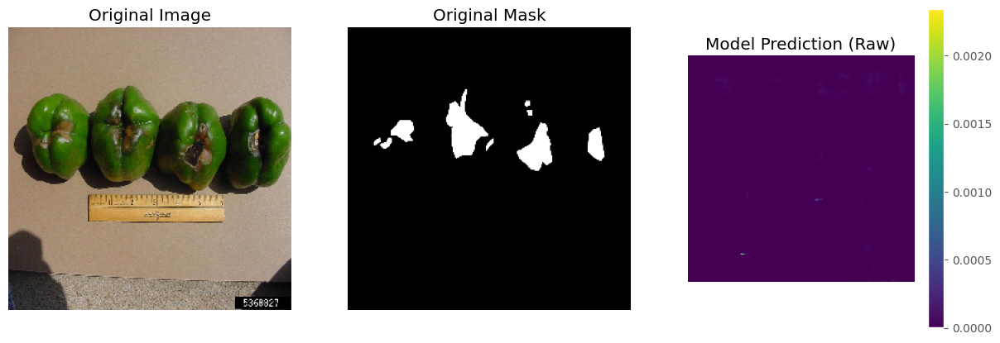

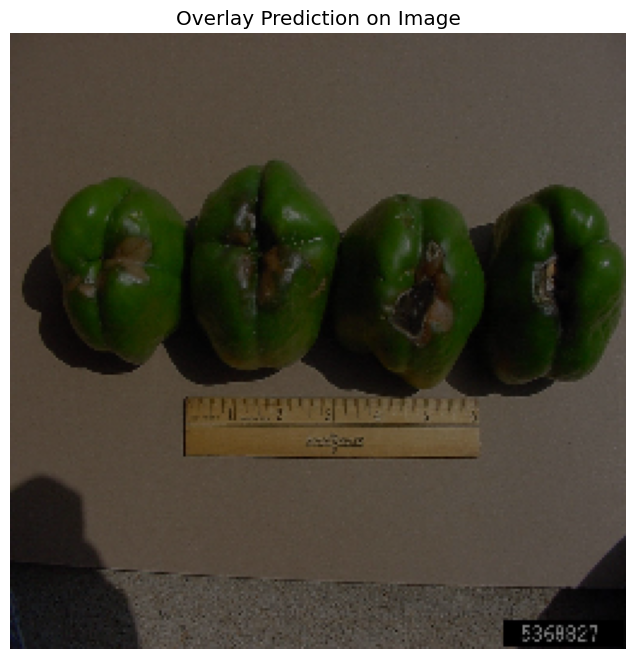

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


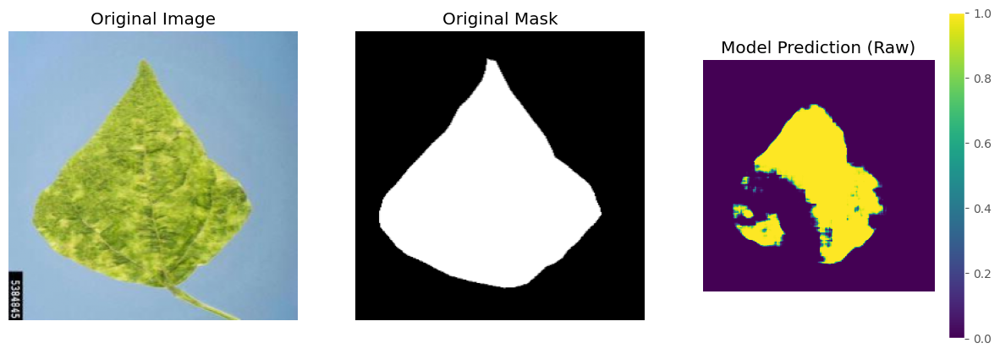

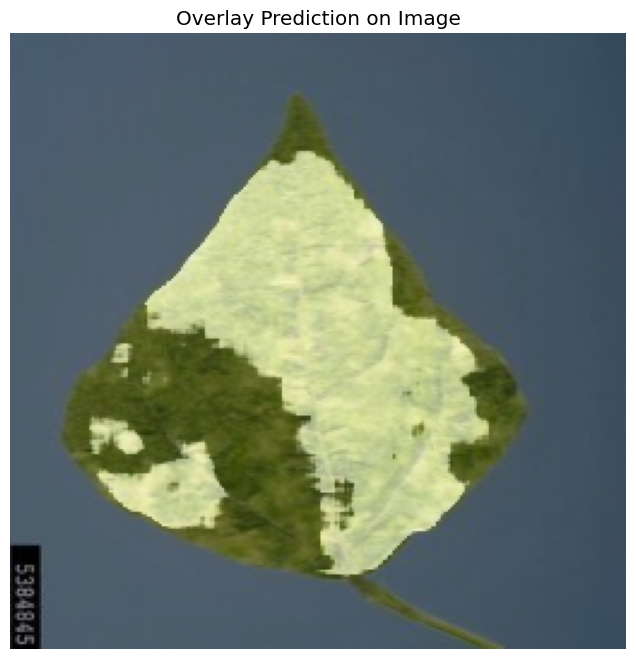

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


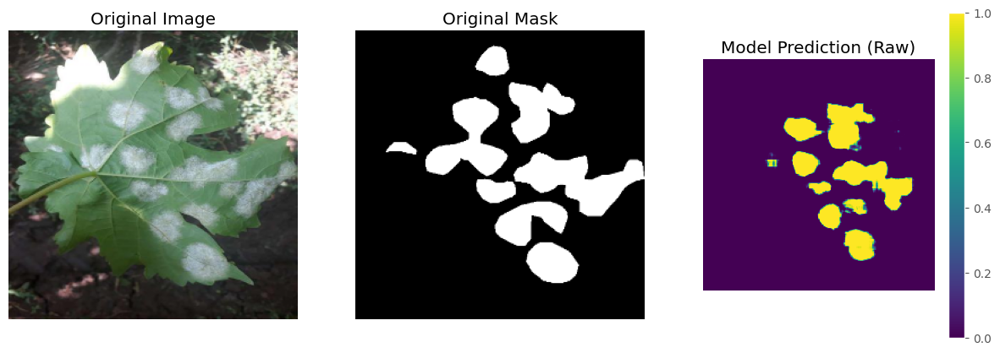

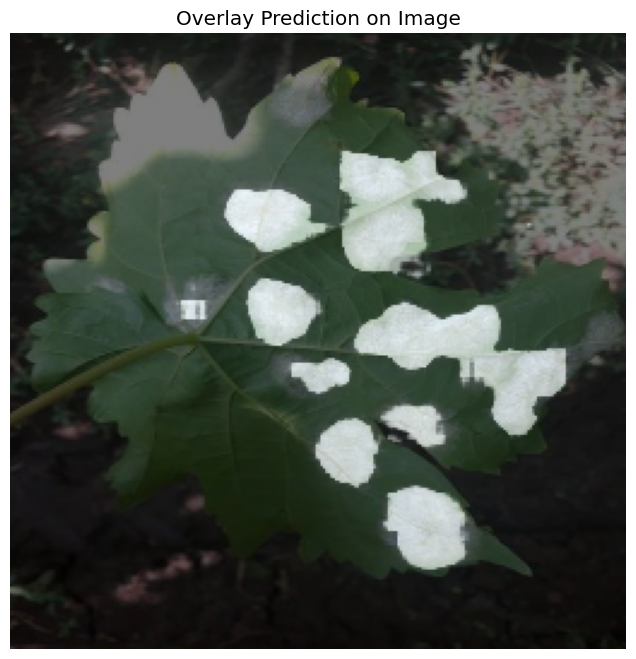

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


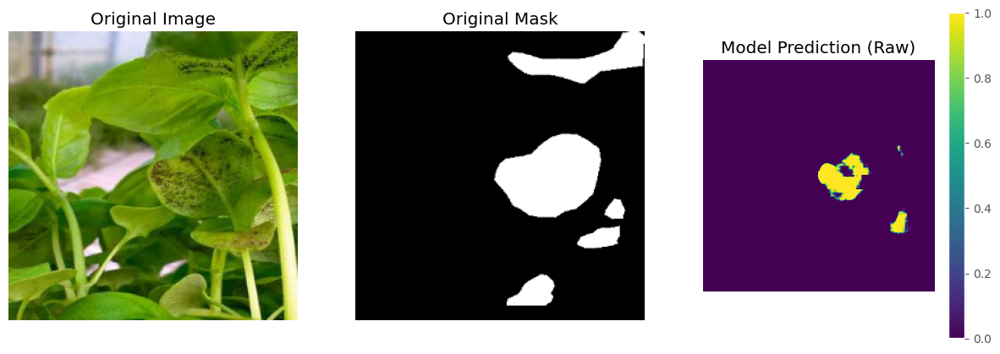

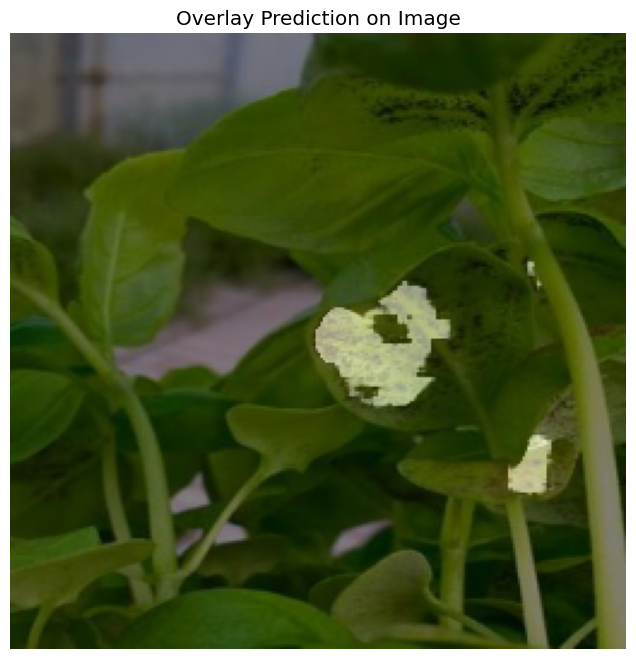

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


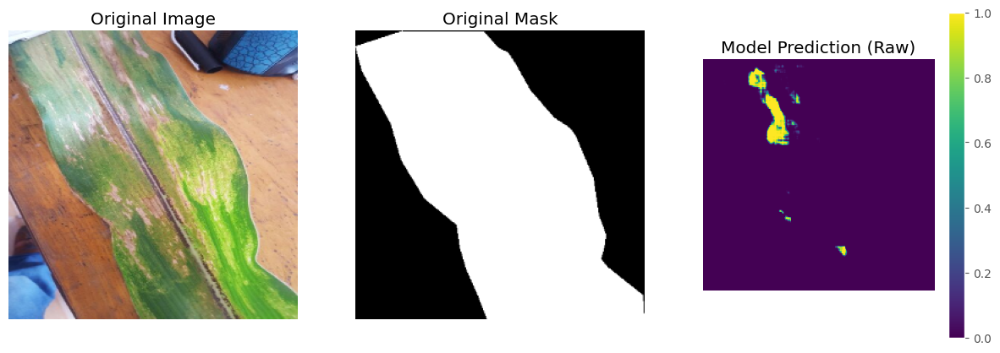

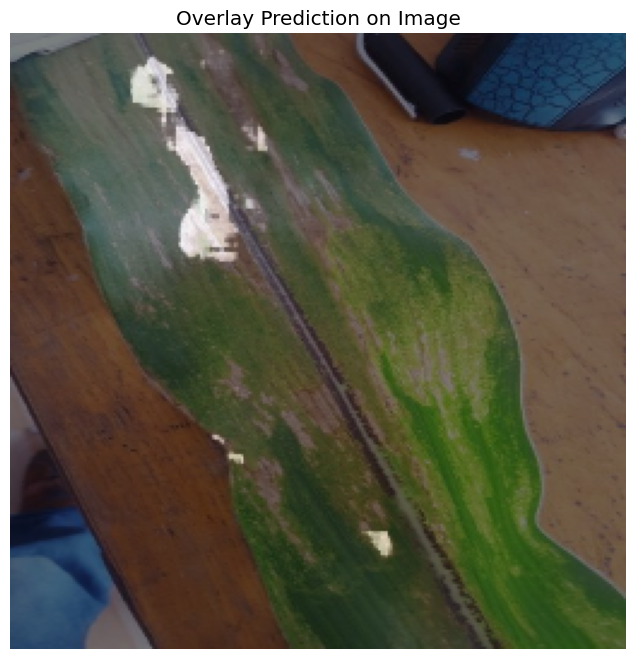

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


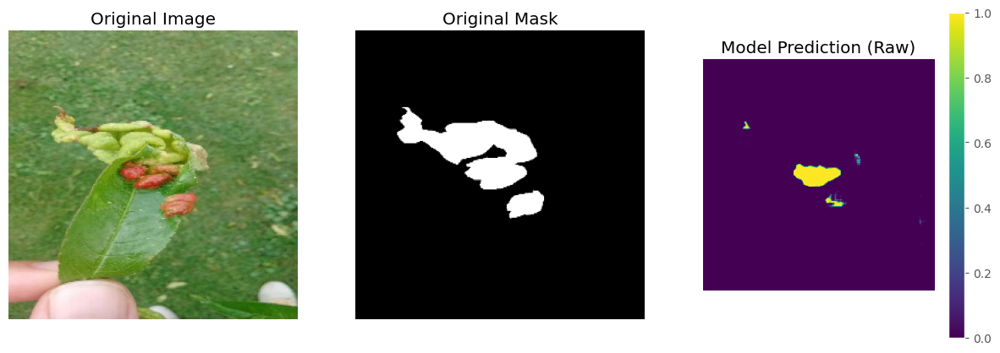

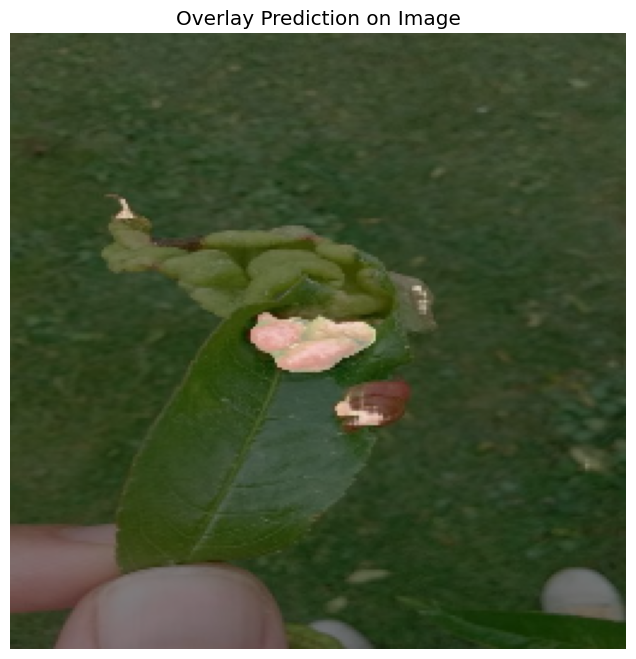

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


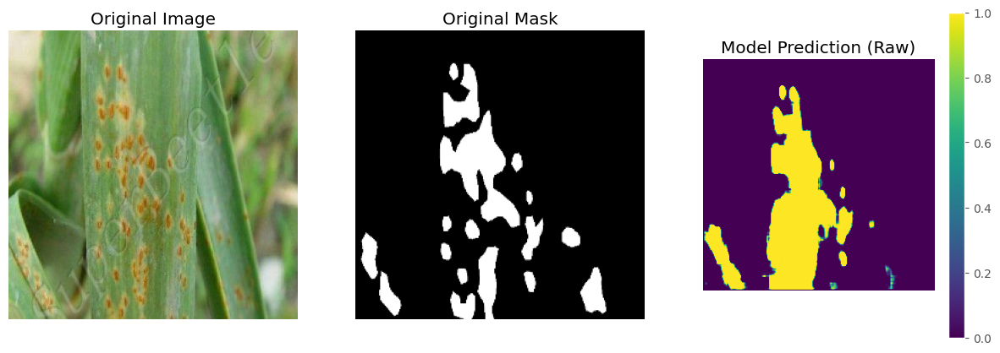

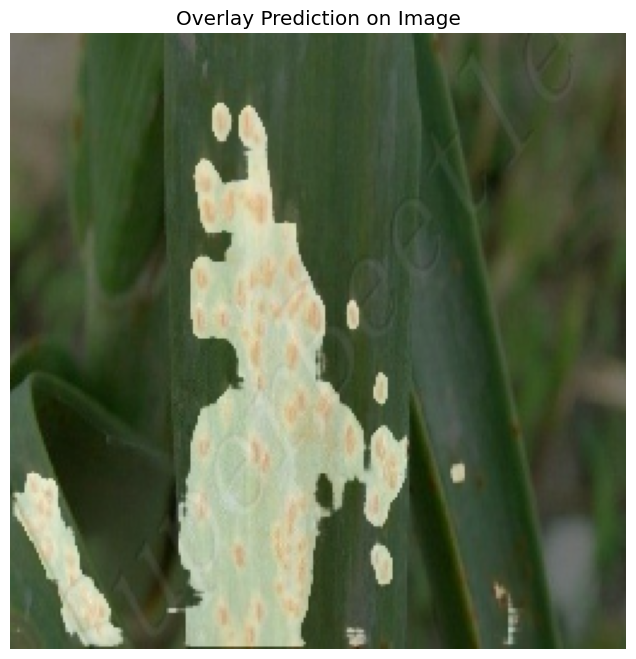

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


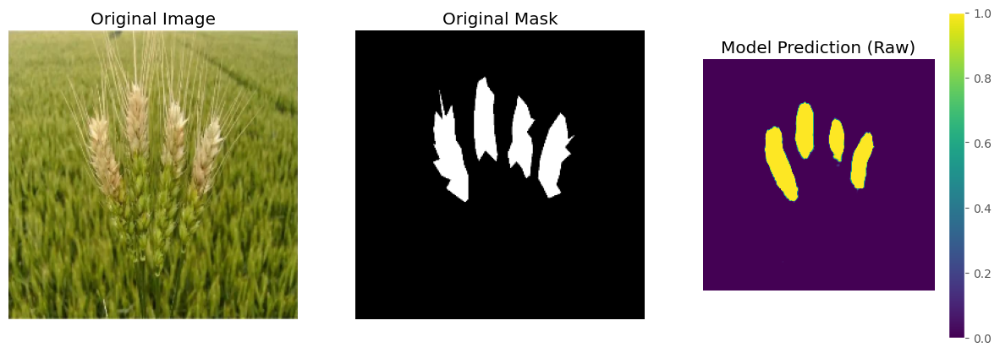

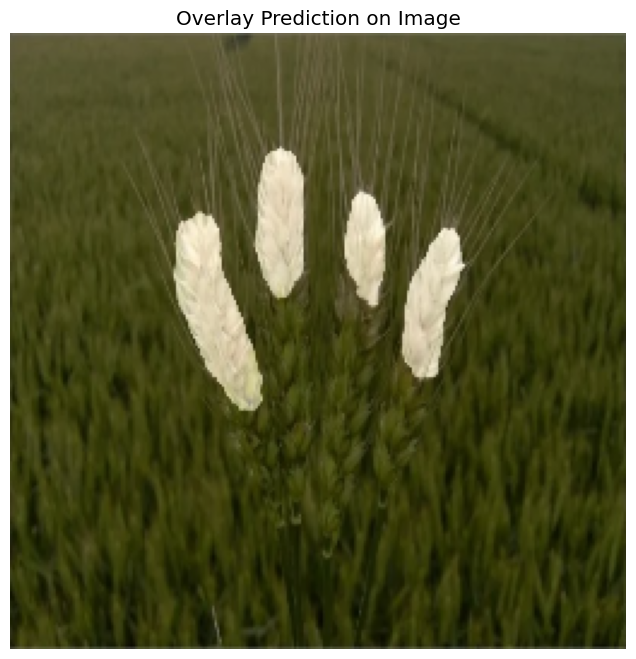

In [14]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

for i in range(20):
    index = np.random.randint(0, len(df_test.index))  # Start from 0 to avoid index error
    
    # Read and preprocess the image
    img_path = df_test['image_filename_test'].iloc[index]
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for visualization
    img = cv2.resize(img, (im_height, im_width))
    img = img / 255.0  # Normalize to [0,1]
    img_input = img[np.newaxis, :, :, :]  # Expand dimensions for model input
    
    # Model prediction
    pred_img = model.predict(img_input)[0]  # Directly get first prediction
    pred_img = cv2.resize(pred_img, (im_width, im_height))  # Resize if needed
    
    # Read and resize the mask
    mask_path = df_test['mask'].iloc[index]
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (im_width, im_height))
    
    # Plotting the results
    plt.figure(figsize=(15, 5))
    
    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')
    
    # Ground Truth Mask
    plt.subplot(1, 3, 2)
    plt.imshow(mask, cmap='gray')
    plt.title("Original Mask")
    plt.axis('off')
    
    # Prediction Visualization (use threshold and overlay)
    plt.subplot(1, 3, 3)
    plt.imshow(pred_img, cmap='viridis')  # Raw prediction
    plt.colorbar()  # Show value scale
    plt.title("Model Prediction (Raw)")
    plt.axis('off')
    
    plt.show()

    # Optional: Overlay prediction on the image
    plt.figure(figsize=(8, 8))
    overlay = (img * 0.5 + np.expand_dims(pred_img, axis=-1) * 0.5)
    plt.imshow(overlay)
    plt.title("Overlay Prediction on Image")
    plt.axis('off')
    plt.show()


In [15]:
from IPython.display import FileLink

# Create a direct download link for the file
FileLink('/kaggle/working/plant_segment.keras')


/kaggle/working/plant_segment.keras

In [16]:
from google.colab import drive
drive.mount('/content/drive')


NotImplementedError: Mounting drive is unsupported in this environment. Use PyDrive instead. See examples at https://colab.research.google.com/notebooks/io.ipynb#scrollTo=7taylj9wpsA2.

In [ ]:
import shutil

# Copy the file to the current working directory
shutil.copy('/kaggle/working/plant_segment.keras', '/kaggle/working/plant_segment_copy.keras')

print("File copied successfully. You can now download it from the Output section in Kaggle.")


In [ ]:
# Compress the file into a ZIP archive
!zip plant_segment_copy.zip /kaggle/working/plant_segment_copy.keras

# Print confirmation
print("File compressed successfully. Look for 'plant_segment_copy.zip' in the Output tab to download.")
